<a href="https://colab.research.google.com/github/Koealaquillage/Correlation-Ouano/blob/main/Detection_panaches_satellite_images_openCV.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# Coastal panaches and satellite images

## Introduction
Coastal panaches are defined as the zone of direct influence of estuarine freshwater in the sea. They are recognized because of the signal of low temperature, low salinity and high turbidity they bring in the ocean water. 

By far the easiest way to identify them is to look at satellite images, where the panaches appear as brownish stain in coastal zones close to the coast. In this notebook, we want to try to develop a simple algorithm to determine the shape and size of panaches from satellite images. 


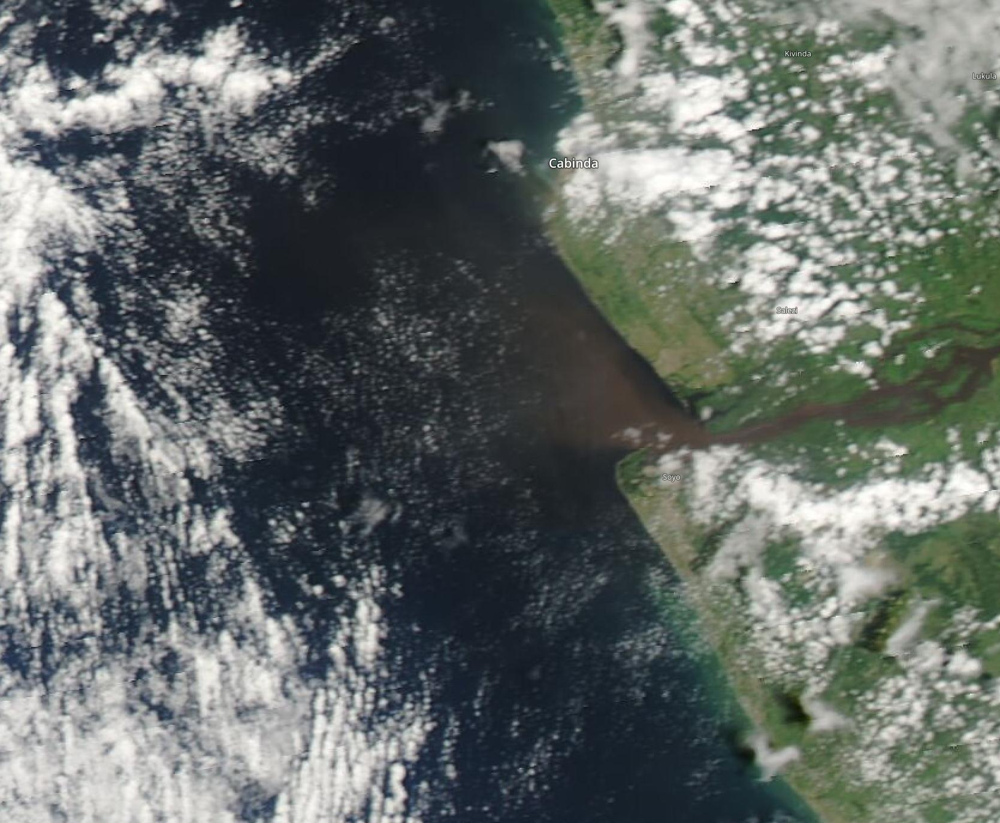


## The method

Here we want to identify the panaches by looking at two at the images. We can see that the panache appear as brown stains in a blue ocean. The images are stored in RGB format - with different channels for blue, red and green color. Therefore, we expect the panache to be surrounded by gradients in the blue and red color in the oceanic side. And green color in the land side.

### The first tests
To treat the images and compute the gradient, I want to use the openCV library ( https://docs.opencv.org). Because I am new to openCV, I have to run a few tests to see how it works. Since I am using a google colab notebook and not doing the test directly on my computer, I have to modify some of the codes of the tutorial; I therefore let everything here.

#### Importing an image
Here I show the code to import an image.

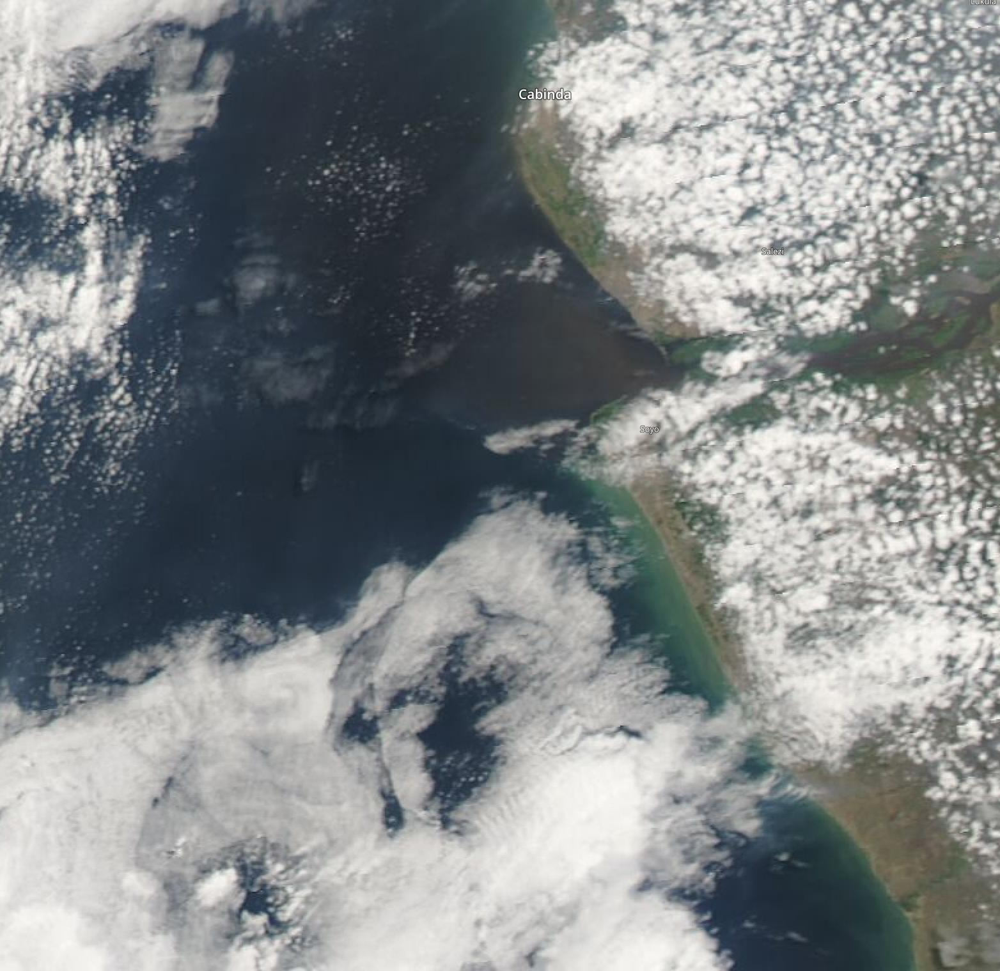

In [6]:
import cv2 as cv
import sys
from google.colab.patches import cv2_imshow
img = cv.imread(cv.samples.findFile("Satellite_images/Congo-2021-10-06T00_00_00Z.jpg"))
if img is None:
    sys.exit("Could not read the image.")
cv2_imshow(img)
k = cv.waitKey(0)
if k == ord("s"):
    cv.imwrite("Satellite_images/Congo-2021-10-06T00_00_00Z.jpg", img)

#### Applying a kernel

If I want to modify an image, I can multiply the value of each zones of pixel by a given matrix - called a kernel - to perform a convolution. Those convolutions can be used to smooth or sharpen images for example. Here I show the application of a sharpening kernel on my image.

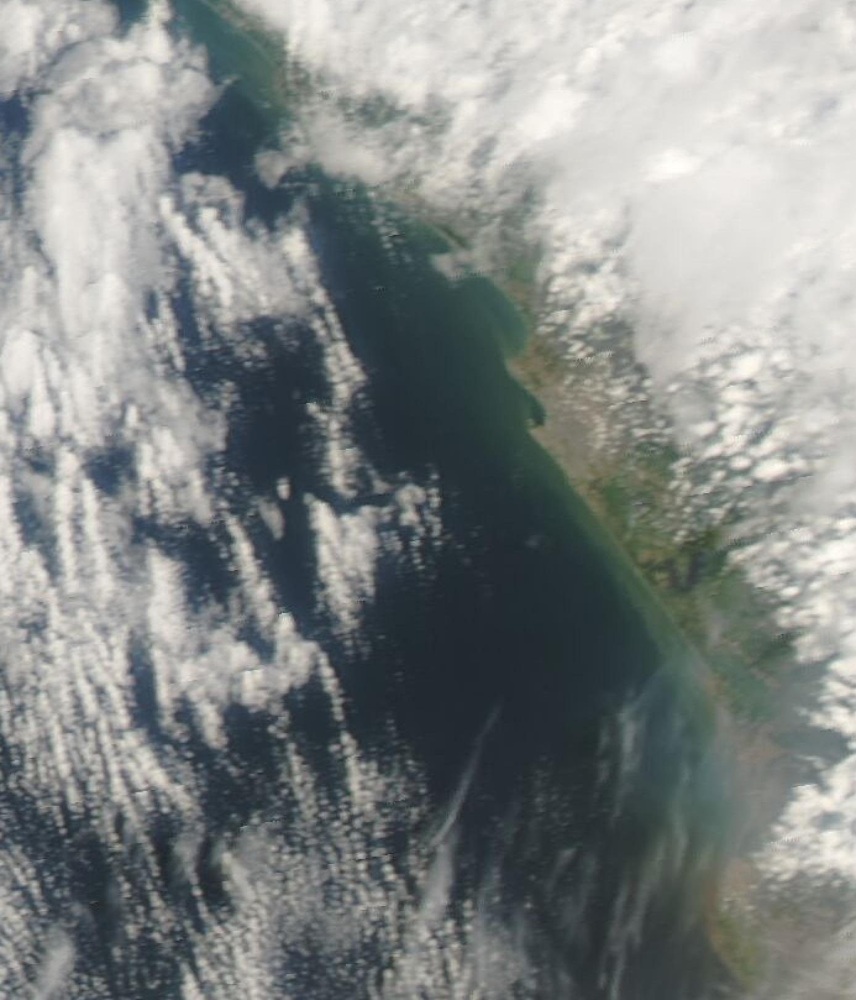

In [11]:
# I have to import numpy to create the kernel
import numpy as np

#  First I define the kernel, here it is a sharpening one
kernel = np.array([[0, -1, 0],
                   [-1, 5, -1],
                   [0, -1, 0]], np.float32)  # kernel should be floating point type

# Second I import an image, I want something than the big Congo one I have above
img = cv.imread(cv.samples.findFile("Satellite_images/Congo_river_4_april_2020.jpg"))

# I show it 
cv2_imshow(img)

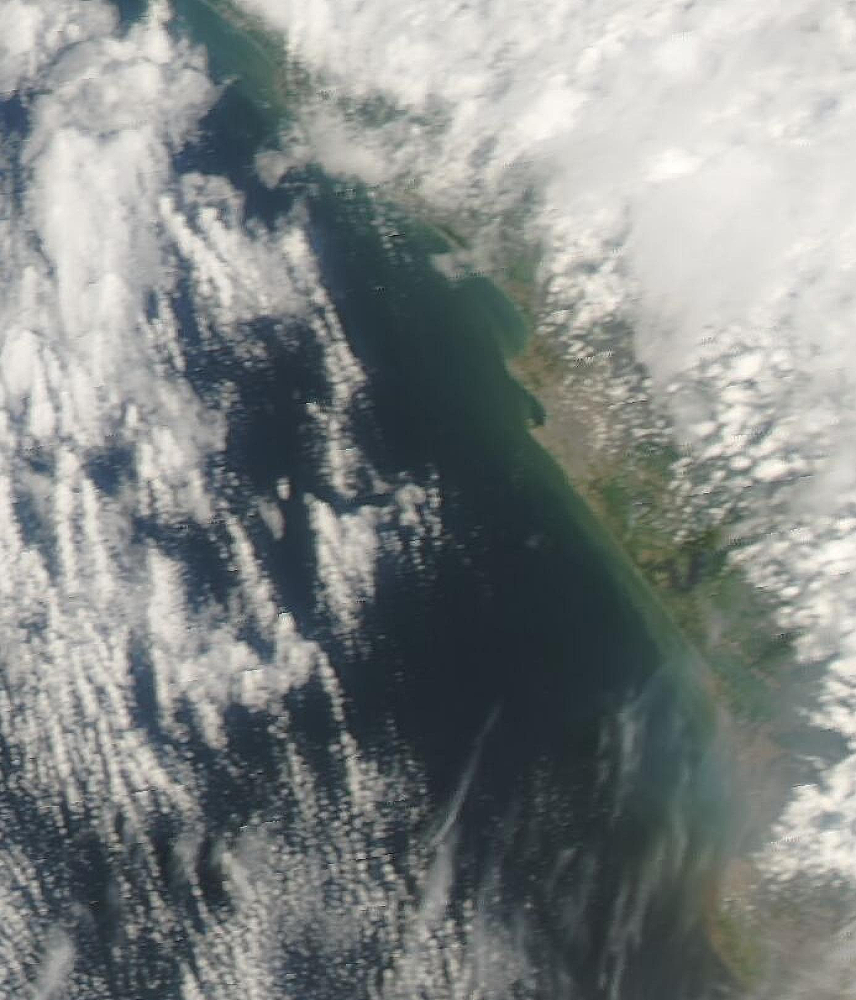

In [12]:
# And I sharpen it with the kernel before showing it again
sharpened_img = cv.filter2D(img, -1, kernel)

cv2_imshow(sharpened_img)

Ok, it did not really improved the image. But at least it did something right?

#### Accessing the RGB value

When we open a jpg image, we automatically access the RGB value. What the code really does is that it creates three matrices with the size of the image, and each matrix contains a value between 0 and 255 for the pixel value of each color. I can open random points in the image and get their pixel values

In [14]:
# First is the blue
print('Blue value at [240,240] is ', img[240,240][0])

# Second is the green 
print('Green value at [240,240] is ', img[240,240][1])

# Third is the red 
print('Red value at [240,240] is ', img[240,240][2])

Blue value at [240,240] is  186
Green value at [240,240] is  190
Red value at [240,240] is  191


Now we can use that to access the value of each channel by simply putting the other channels to 0.

The former picture blue channel looks like


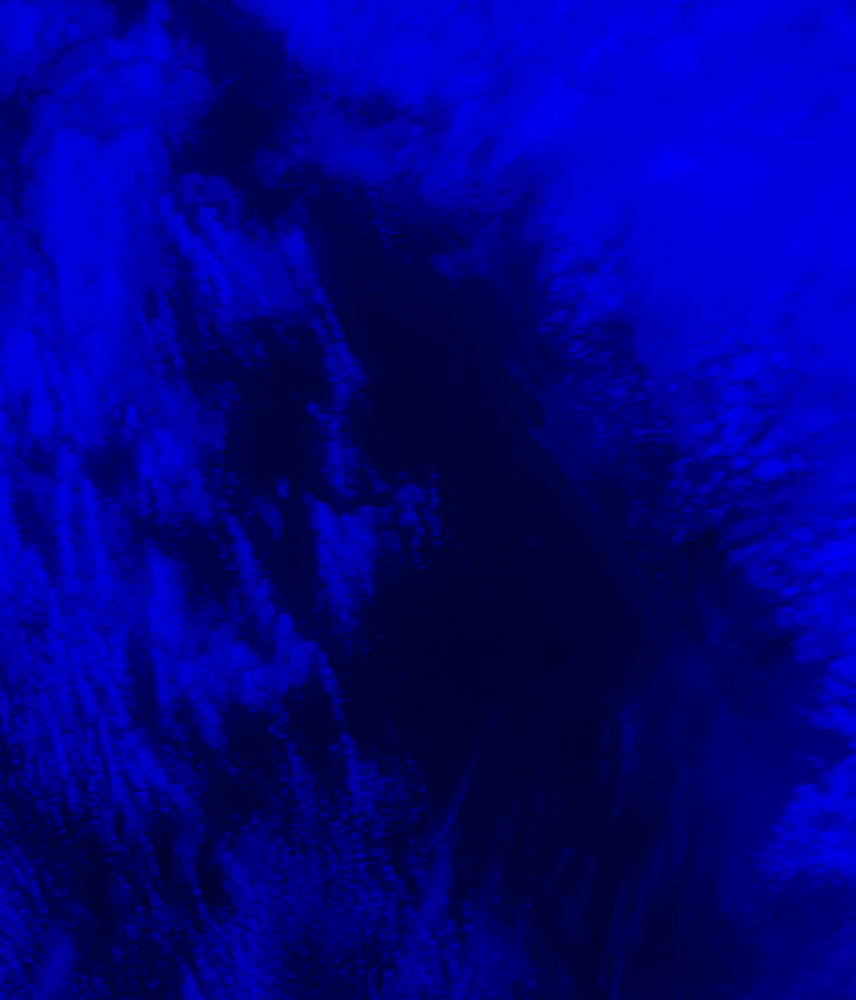

In [15]:
# Here are gonna see the image entirely in blue
print("The former picture blue channel looks like")

img_blue = np.zeros(img.shape)
img_blue[:,:,0] = img[:,:,0]

cv2_imshow(img_blue)

The former picture green channel looks like


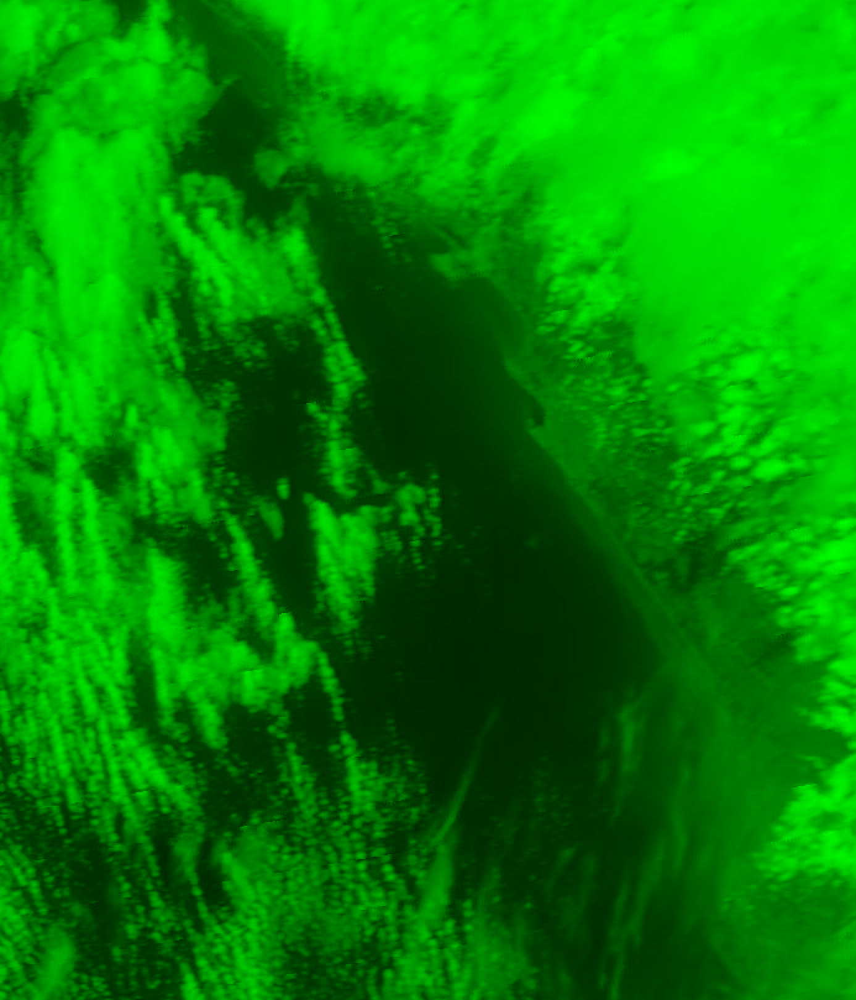

In [16]:
print("The former picture green channel looks like")

img_green = np.zeros(img.shape)
img_green[:,:,1] = img[:,:,1]

cv2_imshow(img_green)

The former picture red channel looks like


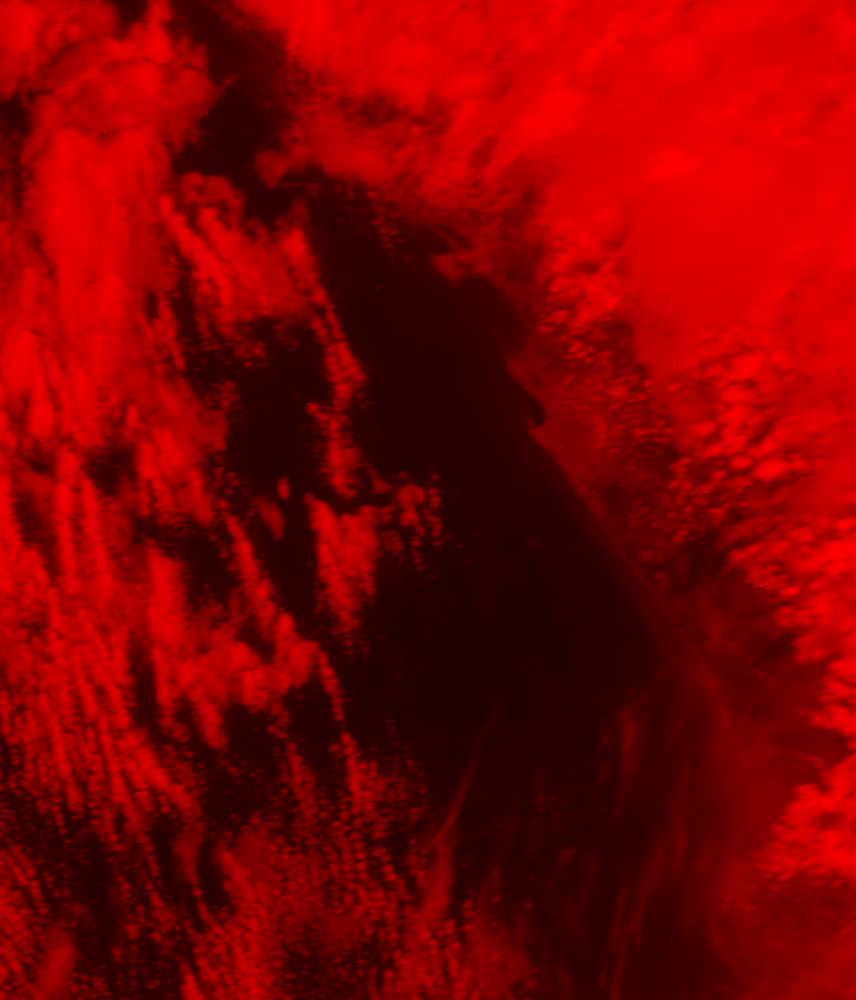

In [18]:
print("The former picture red channel looks like")

img_red = np.zeros(img.shape)
img_red[:,:,2] = img[:,:,2]

cv2_imshow(img_red)

I feel that the three channels are very close, but there is something along the coast in the red and green channels that I do not see in the blue one.

One final thing we can do is show the grey channel. For this we have to do a little manipulation of the image itself.

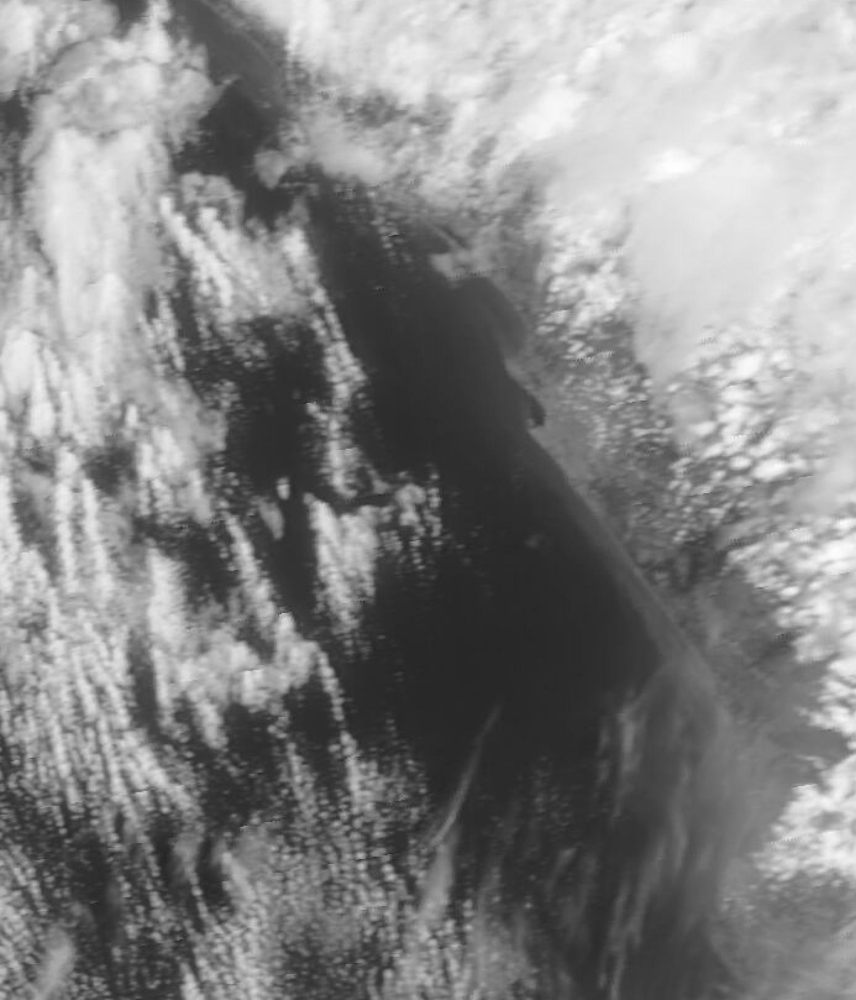

In [19]:
img_grey = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

cv2_imshow(img_grey)

### Edge detection

What we want is the border of the panache zone. Luckily, there are built-in gradient detector in opencv we can implement to do the job. We are gonna try the Canny Edge detector ( https://docs.opencv.org/4.x/da/d5c/tutorial_canny_detector.html ).



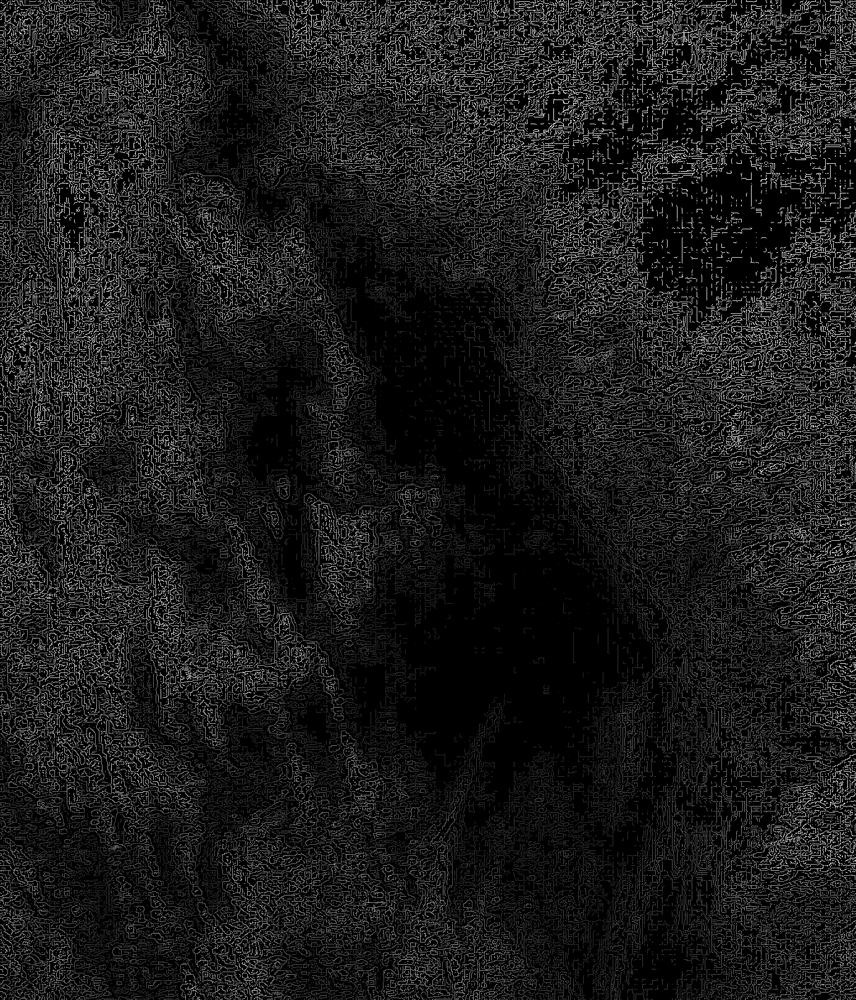

In [45]:
# We need a few parameter to train the edge detector
ratio = 1.2
kernel_size = 2
low_threshold = 5

# This is the canny algorithm itself
img_blur = cv.blur(img_grey, (kernel_size,kernel_size))
detected_edges = cv.Canny(img_blur, low_threshold, low_threshold*ratio, kernel_size)
mask = detected_edges != 0
dst = img_grey * (mask[:,:,None].astype(img_grey.dtype))[:,:,0]
cv2_imshow(dst)

It doesn't work that well. There are probably two reasons: The grey channel is not the most informative. And also, if we choose gradients over absolute values we lose the opportunity to use the brownish color of the panache

## Detection of panache

Now that we have a played a little with openCV, we can try to do some real panache detection. We will take back our first image as a test. The first steps will be to clean the images of the features that are problematic to us: The clouds and the land. Then, we will use the cleaner image to identify the panaches.

### Cleaning of clouds and land

To clean the clouds, we will use the grey channel and remove the highest value: They correspond to high albedo zones and definitely exclude our panaches.

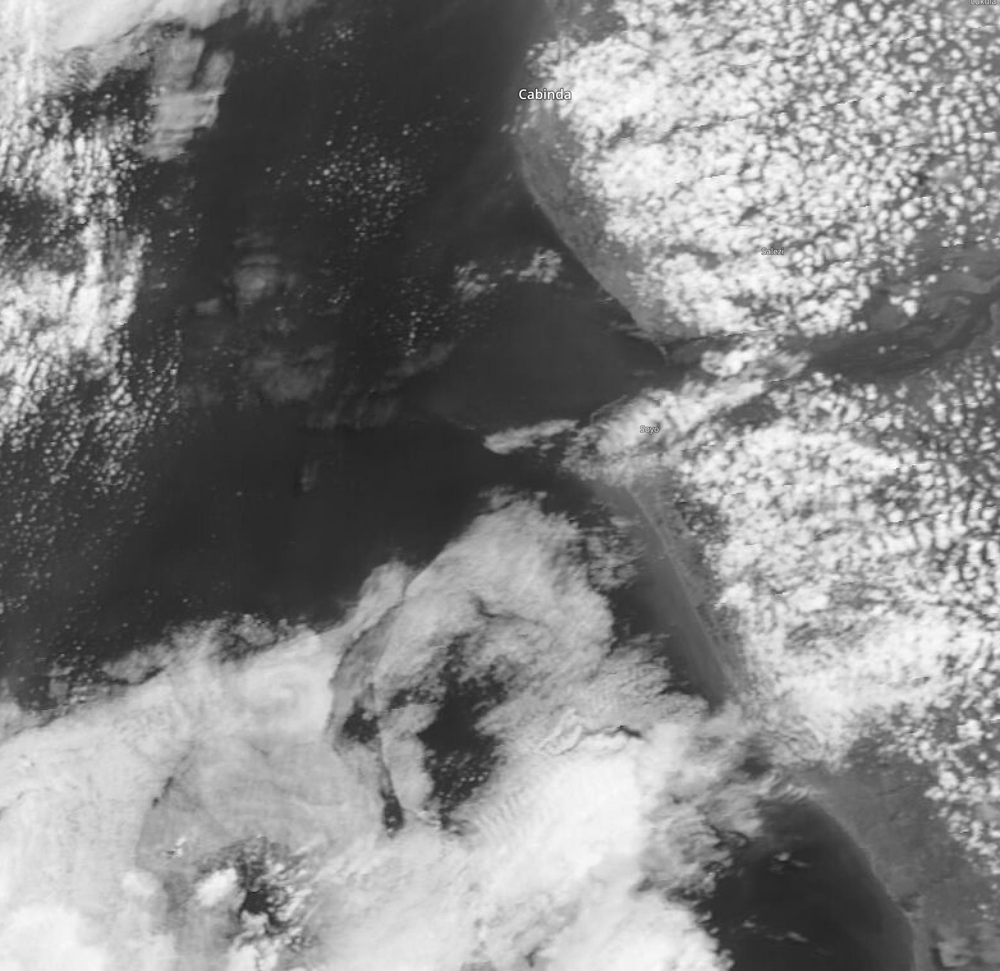

In [47]:
# I reimport my first image and extract the grey channel
img = cv.imread(cv.samples.findFile("Satellite_images/Congo-2021-10-06T00_00_00Z.jpg"))

img_grey = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

cv2_imshow(img_grey)

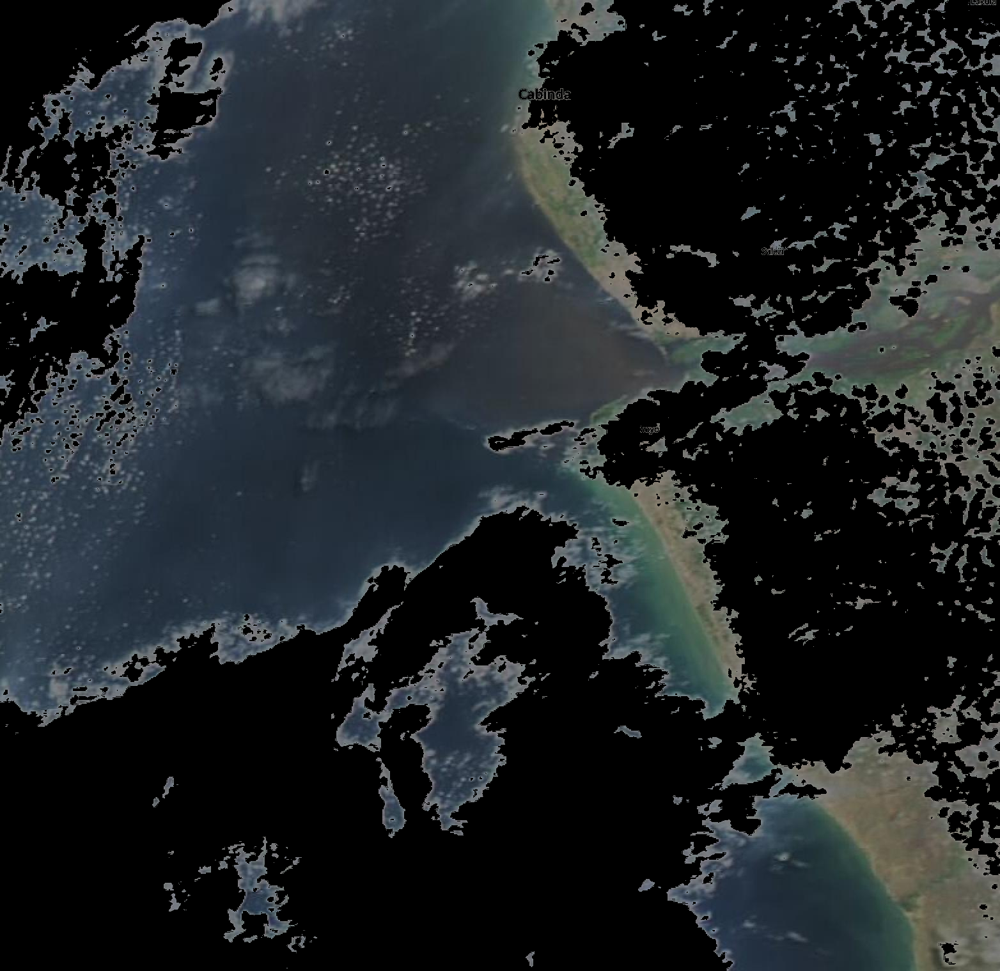

In [51]:
# And I create a mask that exclude the brightest points
mask = img_grey < 130
dst = img * (mask[:,:,None].astype(img.dtype))

# And I print the image without the brightest point
cv2_imshow(dst)